#### Pre-processing: Route Building 

We would like to construct an alternate route design for  a new Manhattan -> LGA Airport bus service. The benchmark system is a shuttle service (the Q70 LGA Shuttle) that runs from Jackson Heights/Woodside to all airport terminals, resulting in a majority of ridership relying on system transfers to complete the "last-mile". The goal is to build an optimal bus route that eliminates the need for this mid-journey transfer, in order to reduce idling times for service and to provide a direct connection to LGA Airport, without the construction costs needed to build a service with grade-separated infrastructure (a new subway route, an "Airtrain" akin to JFK/EWR). 

The goal is to implement a variant of the MCSP (maximal coverage - shortest path) problem to construct this new route. Parameters are governed based on passenger demand and route-based costs (distance and time), drawn from a combination of OD-pair ridership estimates (NYS Open Data), bus location pings (real-time GTFS - for the Q70 service), and OSM route-based attributes (osmnx). The two deliverables/inputs for the model include: 

* $d$, an $m \times 1$ sized vector of demands per nodes. Nodes here are defined as coverage spots and are analogous to subway stations located in Manhattan south of 60th street. The goal is to find which nodes could serve as contenders for stops along this new route (to maximize coverage and minimize accumulated route-based costs). These are gathered from the subway OD-pair dataset in conjunction with estimates drawn from the GTFS feed. This is mainly used for the set-coverage component of the problem
* $D$ and $T$, two $m \times m$ matrices of distances (or times) between each pair of nodes. This is drawn from the `osmnx` python package and its functionality. This is important for determining an optimal route between the coverage-optimized nodes that were selected as stops; in other words, finding a route that minimizes total accumulated costs. 

##### Gather Data Sources

Two Items: 
* `GTFS` feed data acquired by the `load_bus_locations.py` script. This is located in the `q70` table in a local sqlite db. Includes real-time passenger count estimates from the `q70` service.
* `subway_od_pair_demand` (OD Pair aggregated ridership estimates between Manhattan subway stops to Jackson Heights/Woodside), `manhattan_subway_metadata` (metadata associated w/ each subway complex in Manhattan south of 60th st), also tables located in the same local sqlite db. 

In [3]:
import sqlite3
import pandas as pd

db_path = '../data_playground/bus_locations_benchmark2.db'
con = sqlite3.connect(db_path)

#####warning, data below is deprecated, use the static dataset instead from 2022
q70_passenger_estimates = pd.read_sql(
'''
select * from (
    select distinct 
        VehicleID, 
        strftime('%H' , RecordTime) as hour, 
        strftime('%d', RecordTime) as day,
        avg(EstimatedPassengerCount) as ttl_ridership_estimate
    from q70
    where 
        EstimatedPassengerCount is not null 
        and StopPointName = "LGA INTERNAL RDWY/TERMINAL C"
    group by 1,2,3
    order by 1
) 
where day in ('26','27')
;
''', 
con = con
)

q70_passenger_estimates

,VehicleID,hour,day,ttl_ridership_estimate
0,MTABC_6070,15,26,32.0
1,MTABC_6274,13,26,22.0
2,MTABC_6274,19,26,37.0
3,MTABC_6274,20,26,42.0
4,MTABC_6275,00,27,7.0
...,...,...,...,...
64,MTABC_6286,19,26,49.0
65,MTABC_6286,19,27,31.0
66,MTABC_6286,20,26,48.5
67,MTABC_6286,23,27,21.0


In [4]:
pd.read_sql('''select * from manhattan_subway_metadata limit 10''', con = con)

,gtfs_stop_id,station_id,complex_id,division,line,stop_name,borough,cbd,daytime_routes,structure,...,north_direction_label,south_direction_label,ada,ada_northbound,ada_southbound,georeference,:@computed_region_yamh_8v7k,:@computed_region_wbg7_3whc,:@computed_region_kjdx_g34t,ada_notes
0,None,None,613,None,None,Lexington Av/59 St,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,None,None,8,None,None,5 Av/59 St,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
2,None,None,9,None,None,57 St-7 Av,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
3,None,None,10,None,None,49 St,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
4,None,None,611,None,None,Times Sq-42 St,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
5,None,None,607,None,None,34 St-Herald Sq,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
6,None,None,13,None,None,28 St,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
7,None,None,14,None,None,23 St,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
8,None,None,602,None,None,14 St-Union Sq,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
9,None,None,16,None,None,8 St-NYU,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [6]:
subway_od_pair_estimates = \
pd.read_sql(
''' 
select 
    m.complex_id, 
    avg(m.gtfs_latitude) as lat, 
    avg(m.gtfs_longitude) as long, 
    avg(od.ttl_ridership) as ttl_ridership
from manhattan_subway_metadata m 
inner join (
select 
    origin_station_complex_id as complex_id, 
    sum(SUM_estimated_average_ridership) / 212 as ttl_ridership
from subway_od_pair_demand
group by 1
) od using (complex_id)
group by 1
order by 4 desc
;
''', 
con = con
)

subway_od_pair_estimates

,complex_id,lat,long,ttl_ridership
0,611,40.755746,-73.987581,546.590914
1,610,40.751992,-73.977359,329.599541
2,607,40.749643,-73.987887,318.945230
3,609,40.754022,-73.983266,241.285340
4,225,40.758663,-73.981329,226.830780
...,...,...,...,...
60,325,40.722854,-74.006277,6.175954
61,118,40.732849,-73.986122,4.895359
62,329,40.707513,-74.013783,3.971642
63,107,40.706476,-74.011056,2.242308


#### Build demand vector (demand quantities per node)

Define the following parameters:

* $s_i$ : the approximate daily figure of subway riders from stop $i$ to Jackson Heights/Woodside (sourced from NYS Open Data)
* $b$ : the approximate daily figure of q70 bus ridership (sourced from GTFS feed data)

We would like to consider the following:

* What proportion of OD-pair ridership $s_i$ will transfer at Jackson Heights/Woodside for the Q70?
* What proportion of subway traffic into Jackson Heights/Woodside is from Manhattan below 60th st?


In [7]:
#approximate daily q70 ridership from the saved gtfs feed data
daily_q70_ridership_estimate = 2447 #q70_passenger_estimates['ttl_ridership_estimate'].sum()

ttl_traffic = \
pd.read_sql('''select sum(SUM_estimated_average_ridership) / 212 from subway_od_pair_demand;''',con=con)

#what proportion of q70 ridership are Manhattan riders? approximate based on subway OD pair data to Jackson Heights
ttl_traffic = ttl_traffic.iloc[0][0]
manh_cbd_only = subway_od_pair_estimates['ttl_ridership'].sum() 
prop_manh_cbd_only = manh_cbd_only / ttl_traffic
corr = daily_q70_ridership_estimate*prop_manh_cbd_only

subway_od_pair_estimates['demand_weight'] = \
subway_od_pair_estimates['ttl_ridership']/subway_od_pair_estimates['ttl_ridership'].sum() 

subway_od_pair_estimates['d'] = subway_od_pair_estimates['demand_weight']*corr
#subway_od_pair_estimates.to_csv('inputs/demands.csv')

subway_od_pair_estimates

/var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/ipykernel_28576/2334515771.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ttl_traffic = ttl_traffic.iloc[0][0]


,complex_id,lat,long,ttl_ridership,demand_weight,d
0,611,40.755746,-73.987581,546.590914,0.105116,102.341068
1,610,40.751992,-73.977359,329.599541,0.063386,61.712641
2,607,40.749643,-73.987887,318.945230,0.061337,59.717779
3,609,40.754022,-73.983266,241.285340,0.046402,45.177113
4,225,40.758663,-73.981329,226.830780,0.043622,42.470710
...,...,...,...,...,...,...
60,325,40.722854,-74.006277,6.175954,0.001188,1.156356
61,118,40.732849,-73.986122,4.895359,0.000941,0.916584
62,329,40.707513,-74.013783,3.971642,0.000764,0.743631
63,107,40.706476,-74.011056,2.242308,0.000431,0.419839


In [8]:
prop_manh_cbd_only

np.float64(0.3978751390233273)

##### Build Cost Matrices (Distance/Time) per Link/Node Pairing

Use `osmnx` to compute costs per link/pairing between nodes

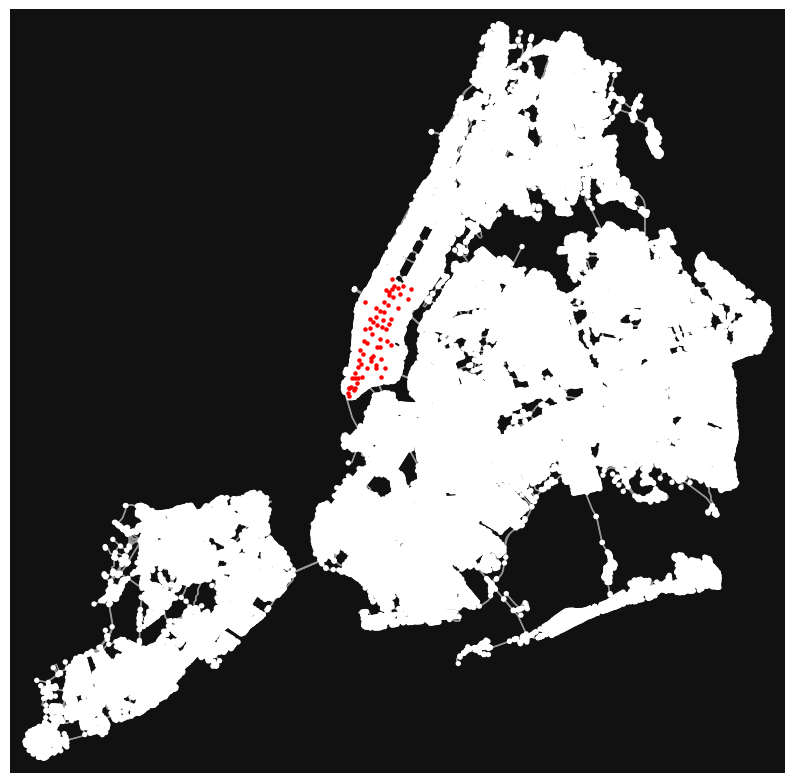

In [11]:
import osmnx as ox
import matplotlib.pyplot as plt 

G = ox.graph_from_place('New York, New York', network_type='drive')

G = ox.add_edge_speeds(G)
G = ox.add_edge_travel_times(G)
ox.save_graphml(G, filepath="inputs/nyc.graphml")

lats = subway_od_pair_estimates['lat'].astype(float)
longs = subway_od_pair_estimates['long'].astype(float)

stops = ox.nearest_nodes(G, longs, lats)
subway_od_pair_estimates['osmnx_node_id'] = stops 

nodes, edges = ox.graph_to_gdfs(G, nodes=True)
nodes = nodes.loc[stops]

fig, ax = ox.plot_graph(G, show=False, close=False, figsize=(10,10))
nodes.plot(ax=ax, color="red", markersize=5)

plt.show()


In [7]:
import os

def calculate_costs(G, lst, i, weight_type='length'):
    temp = []
    #apply dijkstra's algo to every node pair...
    for j in lst:
        r = [k for k in ox.shortest_path(G, i, j, weight=weight_type)] 
        if len(r) == 1: l = 0
        else:
            d=ox.routing.route_to_gdf(G, r)
            l = d[weight_type].sum()
        temp.append(l)
    return temp

def create_matrix(G, stops, weight_type, file, push=True):
    path = f'inputs/{file}.csv'
    if not os.path.exists(path):
        try:
            m = [calculate_costs(G, stops, i, weight_type=weight_type) for i in stops]
        except Exception as e: 
            print(e)
            return []
        
        m_df = pd.DataFrame(m, columns=stops, index=stops)
        if push: 
            m_df.to_csv(path)
    else:
        m_df = pd.read_csv(path, index_col=0)

    return m_df

distances = create_matrix(G, stops, weight_type = 'length', file = 'distances')
times = create_matrix(G, stops, weight_type = 'travel_time', file = 'times')

times

,42439972,9140654137,42430304,42430329,42430352,42449961,42435644,42453952,42447020,42428493,...,42428308,4149936235,42453038,42429661,2821304137,42452015,42431461,4149936245,42432679,1773076511
42439972,0.000000,104.618769,74.260358,39.102253,88.126574,196.835182,74.039354,499.577467,265.518408,254.408808,...,106.129393,544.733860,394.875249,162.650668,473.819832,354.027953,286.744156,540.318086,599.946890,417.763886
9140654137,117.617709,0.000000,112.528984,92.250573,105.131391,102.749525,161.725135,477.702606,174.127481,200.094639,...,163.545048,550.271046,447.617202,250.142940,451.716899,406.769906,232.248470,545.855272,576.843430,363.449717
42430304,74.722592,111.612406,0.000000,49.355456,98.379777,207.088385,49.218414,466.213410,275.771611,188.605444,...,159.066463,519.912920,370.054309,137.829728,440.227704,329.207013,220.940792,515.497146,566.582833,351.960522
42430329,25.367136,92.871672,99.627494,0.000000,49.024321,157.732928,99.406490,524.944603,226.416155,253.338963,...,109.711007,570.100996,420.242385,188.017804,499.186968,379.395089,285.674311,565.685222,625.314026,416.694041
42430352,88.378356,103.685122,155.232209,123.756469,0.000000,108.708608,162.417710,566.244366,177.391834,288.636399,...,60.686686,633.112216,483.253605,251.029024,540.258659,442.406309,320.971747,628.696442,666.613788,451.991477
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42452015,381.408501,410.085912,306.685909,356.041365,405.065686,494.309173,330.856866,145.549514,566.057323,216.681224,...,461.520983,205.556066,40.847296,231.400851,119.791879,0.000000,258.685663,201.140292,245.918937,114.469916
42431461,303.724200,231.000878,229.001607,278.357064,326.308107,275.208609,278.076432,317.357920,346.956759,48.997722,...,386.994793,389.926360,287.272516,154.115266,291.372213,246.425220,0.000000,385.510586,384.213066,161.245812
4149936245,553.229069,560.293844,478.506477,527.861933,576.886254,637.335937,495.955041,68.868413,699.607836,366.889156,...,626.619158,4.415774,159.349781,403.221419,108.810001,203.816647,401.712428,0.000000,98.907541,254.951912
42432679,571.105465,559.247104,496.382873,545.738329,594.762650,597.699076,513.831437,86.744809,648.103167,365.842416,...,644.495554,81.446675,177.226177,421.097815,126.686396,221.693043,386.699719,84.225136,0.000000,211.689862


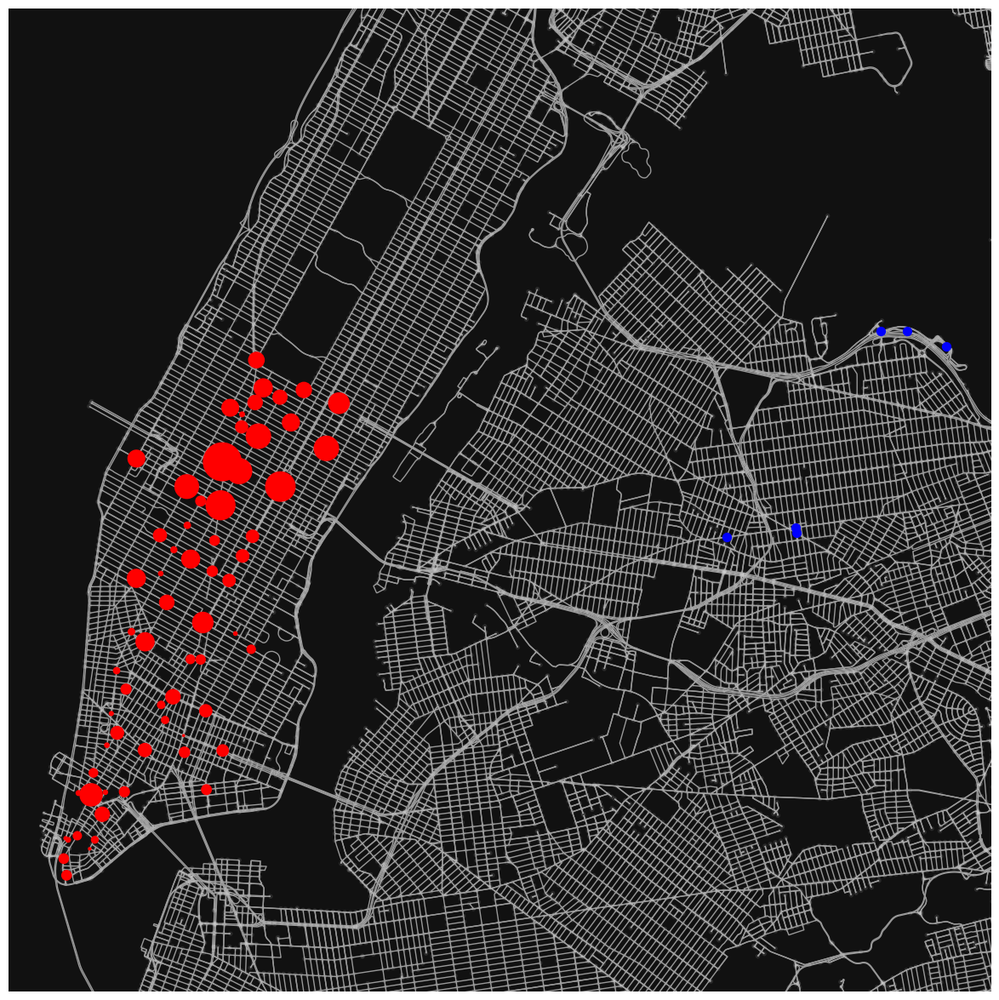

In [8]:
import numpy as np 
import geopandas as gpd

get_airport_loc = pd.read_sql('''select * from q70_stops_metadata;''', con = con)

airport_lats = get_airport_loc['lat'].astype(float)
airport_longs = get_airport_loc['lon'].astype(float)

airport_nodes = ox.nearest_nodes(G, airport_longs, airport_lats)
get_airport_loc['osmnx_node_id'] = airport_nodes

#get_airport_loc
#airport_facility = get_airport_loc.loc[get_airport_loc['name'] == 'LGA INTERNAL RDWY/TERMINAL C']
#airport_facility.iloc[0]
center = (40.75047690227571, -73.94050480138289)
radius = 7000
bbox = ox.utils_geo.bbox_from_point(center, dist=radius)
fig, ax = ox.plot_graph(
    G, 
    show=False, 
    close=False, 
    figsize=(15,15), 
    bbox=bbox, 
    node_alpha=0.1,
)

subway_od_pair_estimates_reindexed = subway_od_pair_estimates.set_index('osmnx_node_id')
manh_demand_stop_nodes = pd.concat((subway_od_pair_estimates_reindexed[['d']], nodes), axis=1)[['d','geometry']]
manh_demand_stop_nodes = gpd.GeoDataFrame(manh_demand_stop_nodes)
manh_demand_stop_nodes.plot(
    ax=ax, 
    color="red", 
    markersize=manh_demand_stop_nodes['d']*10
)

all_nodes, all_edges = ox.graph_to_gdfs(G, nodes=True)
airport_nodes = all_nodes.loc[airport_nodes]
airport_nodes.plot(
    ax=ax, 
    color="blue", 
    markersize=50
)

plt.show()



In [9]:
#add the terminal stop (LGA airport terminals...) to the cost matrices, demand vector
airport_facility_node_id = get_airport_loc.loc[get_airport_loc['name'] == 'LGA INTERNAL RDWY/TERMINAL C']['osmnx_node_id'].iloc[0]
dist_airport_fac = calculate_costs(G, stops, airport_facility_node_id, weight_type='length')
time_airport_fac = calculate_costs(G, stops, airport_facility_node_id, weight_type='travel_time')
distances[airport_facility_node_id] = dist_airport_fac
times[airport_facility_node_id] = time_airport_fac
dist_airport_fac.append(0)
time_airport_fac.append(0)

idx = np.append(stops, airport_facility_node_id)

#row_dist_airport_fac = pd.DataFrame([dist_airport_fac], columns=np.append(stops, airport_facility_node_id), index=[airport_facility_node_id])
#row_time_airport_fac = pd.DataFrame([time_airport_fac], columns=np.append(stops, airport_facility_node_id), index=[airport_facility_node_id])
distances_update = pd.DataFrame(np.vstack((distances.values, np.array(dist_airport_fac))), index=idx, columns=idx)
distances_update.to_csv('inputs/distances_w_airport_fac.csv')
times_update = pd.DataFrame(np.vstack((times.values, np.array(time_airport_fac))), index=idx, columns=idx)
times_update.to_csv('inputs/times_w_airport_fac.csv')

times_update

,42439972,9140654137,42430304,42430329,42430352,42449961,42435644,42453952,42447020,42428493,...,4149936235,42453038,42429661,2821304137,42452015,42431461,4149936245,42432679,1773076511,5969794486
42439972,0.000000,104.618769,74.260358,39.102253,88.126574,196.835182,74.039354,499.577467,265.518408,254.408808,...,544.733860,394.875249,162.650668,473.819832,354.027953,286.744156,540.318086,599.946890,417.763886,894.406353
9140654137,117.617709,0.000000,112.528984,92.250573,105.131391,102.749525,161.725135,477.702606,174.127481,200.094639,...,550.271046,447.617202,250.142940,451.716899,406.769906,232.248470,545.855272,576.843430,363.449717,821.344634
42430304,74.722592,111.612406,0.000000,49.355456,98.379777,207.088385,49.218414,466.213410,275.771611,188.605444,...,519.912920,370.054309,137.829728,440.227704,329.207013,220.940792,515.497146,566.582833,351.960522,855.048799
42430329,25.367136,92.871672,99.627494,0.000000,49.024321,157.732928,99.406490,524.944603,226.416155,253.338963,...,570.100996,420.242385,188.017804,499.186968,379.395089,285.674311,565.685222,625.314026,416.694041,869.039163
42430352,88.378356,103.685122,155.232209,123.756469,0.000000,108.708608,162.417710,566.244366,177.391834,288.636399,...,633.112216,483.253605,251.029024,540.258659,442.406309,320.971747,628.696442,666.613788,451.991477,916.808963
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42431461,303.724200,231.000878,229.001607,278.357064,326.308107,275.208609,278.076432,317.357920,346.956759,48.997722,...,389.926360,287.272516,154.115266,291.372213,246.425220,0.000000,385.510586,384.213066,161.245812,917.044247
4149936245,553.229069,560.293844,478.506477,527.861933,576.886254,637.335937,495.955041,68.868413,699.607836,366.889156,...,4.415774,159.349781,403.221419,108.810001,203.816647,401.712428,0.000000,98.907541,254.951912,1141.339429
42432679,571.105465,559.247104,496.382873,545.738329,594.762650,597.699076,513.831437,86.744809,648.103167,365.842416,...,81.446675,177.226177,421.097815,126.686396,221.693043,386.699719,84.225136,0.000000,211.689862,1104.330898
1773076511,419.915814,347.557242,345.193222,394.548678,442.499721,410.633366,386.573239,179.084123,482.381516,154.152554,...,251.652563,151.262190,270.009072,154.171694,110.414894,175.009857,247.236789,224.938976,0.000000,894.102640


In [18]:
#distances_update.loc[5969794486]
pd.read_csv('inputs/distances_w_airport_fac.csv', index_col=[0])

,42439972,9140654137,42430304,42430329,42430352,42449961,42435644,42453952,42447020,42428493,...,4149936235,42453038,42429661,2821304137,42452015,42431461,4149936245,42432679,1773076511,5969794486
42439972,0.000000,1145.047217,829.931703,430.723300,998.175484,2244.660758,827.461763,5587.051075,3043.102322,2843.265776,...,6397.376509,4416.901992,1817.779346,5299.184458,3960.393750,3204.644726,6348.025943,6708.776957,4668.917589,12954.411612
9140654137,1293.020074,0.000000,1257.074843,1018.502664,1169.271635,1158.654004,1806.853557,5338.791050,1959.200250,2236.252127,...,6149.813922,5002.557412,2795.044596,5048.375515,4546.049170,2595.602448,6100.463356,6460.516932,4061.903940,12056.691059
42430304,828.810375,1268.615769,0.000000,554.292966,1121.745150,2366.398735,550.063624,5210.388123,3166.670874,2107.849200,...,6021.410994,4139.503853,1540.381208,4919.972587,3682.995611,2469.228150,5972.060428,6332.114004,3933.501013,12646.159908
42430329,274.517409,1040.833113,1104.449112,0.000000,567.452184,1815.273167,1101.979172,5861.568484,2613.714731,2834.211106,...,6671.893918,4691.419401,2092.296755,5573.701867,4234.911159,3195.590056,6622.543352,6983.294366,4659.862918,12780.161996
42430352,999.845996,1161.376448,1741.321654,1392.078034,0.000000,1249.491454,1827.307758,6334.782096,2046.930015,3232.243173,...,7145.804968,5416.747987,2817.625342,6044.366561,4960.239745,3593.622123,7096.454402,7456.507978,5057.894986,12275.730202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42431461,3388.125978,2581.659399,2559.315603,3113.608569,3681.060753,3075.723769,3107.774476,3546.783296,3877.579102,547.597183,...,4357.806168,3210.549658,1722.387930,3256.367760,2754.041416,0.000000,4308.455601,4293.954548,1802.078713,13345.605396
4149936245,6176.585472,6261.828440,5347.775097,5902.068063,6469.520247,7122.848727,5599.359587,769.671468,7924.704061,4100.343019,...,49.350566,1780.888723,4506.391377,1216.057544,2277.849188,4489.526935,0.000000,1064.212551,2849.335485,17482.165068
42432679,6376.371576,6250.130101,5547.561201,6101.854167,6669.306351,6955.067110,5799.145691,969.457572,7756.922443,4088.644680,...,910.245778,1980.674827,4706.177481,1415.843648,2477.635292,4321.745318,941.297780,0.000000,2365.840018,17470.141883
1773076511,4686.680234,3884.290083,3857.869859,4412.162825,4979.615009,4589.227092,4320.331779,1909.365163,5391.082425,1722.804662,...,2720.388035,1690.502034,3017.613887,1723.018566,1233.993792,1955.905300,2671.037468,2513.911742,0.000000,14982.548404


In [15]:
manh_demand_stop_nodes_no_geom = manh_demand_stop_nodes[['d']]
s=pd.DataFrame([manh_demand_stop_nodes_no_geom['d'].sum()], index=[airport_facility_node_id], columns=['d'])
demand_vector = pd.concat((manh_demand_stop_nodes_no_geom,s))

demand_vector.to_csv('inputs/demands_w_airport_fac.csv')

In [16]:
demand_vector

,d
42439972,102.341068
9140654137,61.712641
42430304,59.717779
42430329,45.177113
42430352,42.470710
...,...
42431461,0.916584
4149936245,0.743631
42432679,0.419839
1773076511,0.283524


In [17]:
demand_vector.sum()

d    1947.20093
dtype: float64

##### Scenario A: Parallel Route Design -- Maximal Coverage Optimization for Stop Selection 

Identify where to place stops for the alternative route based on the inferred demands calculated above

Restricted license - for non-production use only - expires 2025-11-24
Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (mac64[arm] - Darwin 23.3.0 23D56)

CPU model: Apple M3 Pro
Thread count: 11 physical cores, 11 logical processors, using up to 11 threads

Optimize a model with 67 rows, 132 columns and 566 nonzeros
Model fingerprint: 0x1ee16e14
Variable types: 0 continuous, 132 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [3e-01, 1e+03]
  Bounds range     [1e+00, 1e+00]
  RHS range        [5e+00, 5e+00]
Found heuristic solution: objective 298.7582688
Presolve removed 5 rows and 9 columns
Presolve time: 0.00s
Presolved: 62 rows, 123 columns, 512 nonzeros
Variable types: 0 continuous, 123 integer (120 binary)
Found heuristic solution: objective 1272.3587340

Root relaxation: objective 1.630483e+03, 78 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj

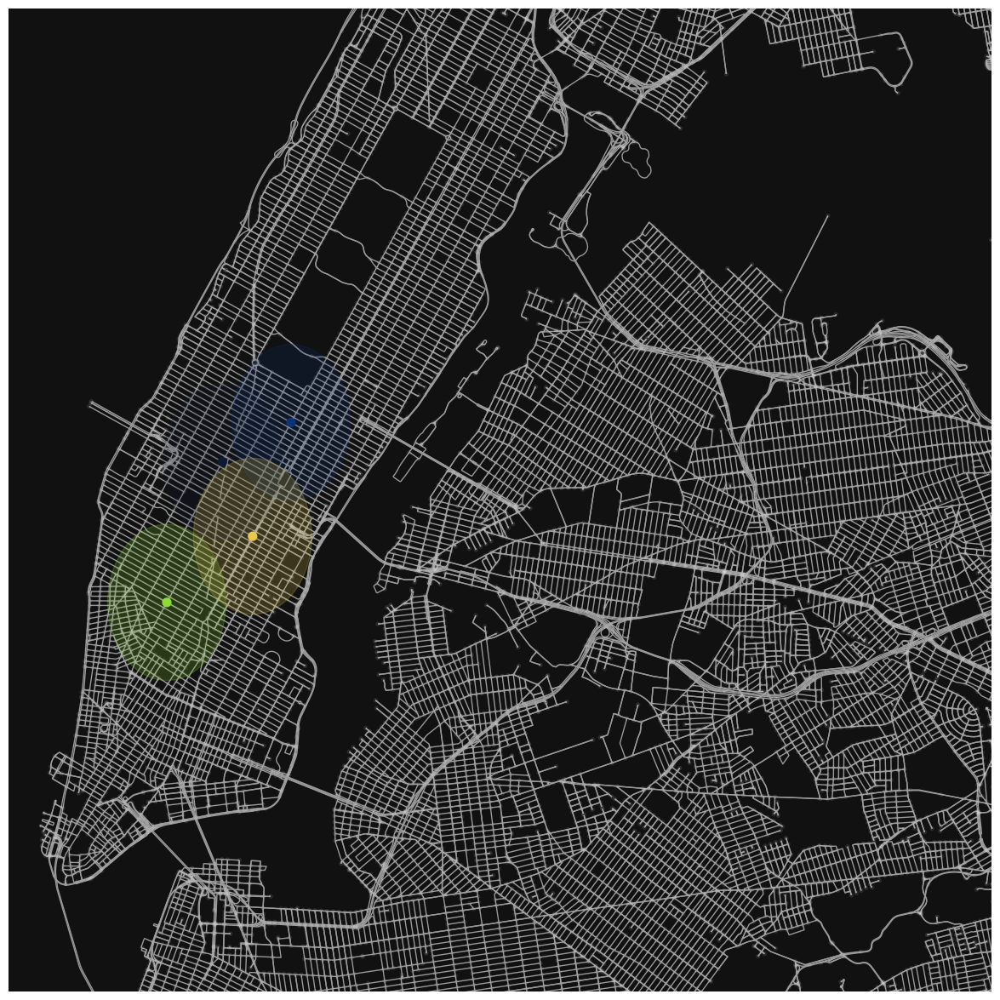

{'Stops': [42439972, 42436700, 42430253, 4597668020, 5969794486],
 'Covered Demand': 1630.4834171646175}

In [19]:
from gurobipy import * 

def search_nearby_nodes(node_id, D, S):
    s=(D.loc[int(node_id)] < S)
    if len(s) < 1:
        return []
    return s[s==True].index

def plot_assignments(coverage_radius, assigned_nodes):
    _ , ax = ox.plot_graph(
        G, 
        show=False, 
        close=False, 
        figsize=(15,15), 
        bbox=bbox, 
        node_alpha=0.1,
    )
    assigned_nodes = nodes.loc[assigned_nodes[:-1]]
    assigned_nodes['c_id'] = [np.random.rand(3) for _ in range(len(assigned_nodes))]
    assigned_nodes.plot(ax=ax, c=assigned_nodes["c_id"], markersize=50)
    coverage_radius /= 100000
    for _, r in assigned_nodes.iterrows():
        ax.add_patch(
            plt.Circle((r['x'], r['y']), 
            radius = coverage_radius, 
            color=r['c_id'], 
            alpha=0.2
        )
    )     
    plt.show()
    pass 

def coverage_optimized_stops(
    num_stops: int, 
    coverage_radius: int, 
    node_demands: pd.DataFrame, 
    link_distances: pd.DataFrame, 
    plot = True
):
    model = Model("Max Coverage Example")

    ttl_stops = num_stops + 1
    node_demands = node_demands['d']

    #define X_i, which determines whether a node is covered...
    vars_covered_id = [f'X_{i}' for i in node_demands.index]
    vars_covered = model.addVars(vars_covered_id, vtype=GRB.INTEGER, name='placements', lb=0, ub=1) 
    vars_covered_arr = np.array(list(vars_covered.values()))

    #define Y_i, determining facility assignment
    vars_fac_id = [f'Y_{i}' for i in node_demands.index]
    vars_fac = model.addVars(vars_fac_id, vtype=GRB.INTEGER, name='placements', lb=0, ub=1) 

    obj_fn = (node_demands*vars_covered_arr).sum() 
    model.setObjective(obj_fn, GRB.MAXIMIZE) 

    #enforce number of stations
    model.addConstr(sum(vars_fac.values()) == ttl_stops)

    #ensure a node is covered by at least one stop...
    for id, x_i in vars_covered.items():
        node_id = id.replace('X_', '')
        N_i = search_nearby_nodes(node_id, link_distances, coverage_radius) 
        coverage_i = 0
        for y_j in N_i: 
            node_id_j = f'Y_{y_j}'
            coverage_i += vars_fac[node_id_j]
        model.addConstr(x_i <= coverage_i)

    model.optimize()
    assigned_stops = [
        int(i.replace('Y_', '')) for i,k in vars_fac.items() if k.X == 1
    ]

    if plot: plot_assignments(coverage_radius, assigned_stops)
    
    return {
        'Stops': assigned_stops, 
        'Covered Demand': obj_fn.getValue()
    }

coverage_optimized_stops(
    num_stops=4,
    coverage_radius=1000,
    node_demands=demand_vector, 
    link_distances=distances_update, 
    plot=True
)
#vars_fac

What if we treat each of the chosen stop assignments as separate "routes" from one another? That is, instead of connecting all Manhattan stops, consider direct links between each individual stop to LGA Airport, operating in parallel. 

Consider: 
* Maximizing Coverage over the "start nodes" (see above...)
* Minimizing cost (time-in-ride) per link, using the cost matrix 
* [Optional] fleet assignments / operational capacities 

/opt/anaconda3/lib/python3.12/site-packages/pulp/pulp.py:1298: UserWarning: Spaces are not permitted in the name. Converted to '_'
  warnings.warn("Spaces are not permitted in the name. Converted to '_'")


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /opt/anaconda3/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/0744e3c15e3d44bab3ecea4f7fc782cd-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/0744e3c15e3d44bab3ecea4f7fc782cd-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 73 COLUMNS
At line 1526 RHS
At line 1595 BOUNDS
At line 1728 ENDATA
Problem MODEL has 68 rows, 132 columns and 1057 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 523.763 - 0.00 seconds
Cgl0004I processed model has 68 rows, 132 columns (132 integer (132 of which binary)) and 1057 elements
Cbc0038I Initial state - 0 integers unsatisfied sum - 0
Cbc0038I Solution found of -523.763
Cbc0038I Before mini branch and bound, 132 integers at bound 

/opt/anaconda3/lib/python3.12/site-packages/osmnx/plot.py:348: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(od_x, od_y, s=orig_dest_size, c=route_color, alpha=route_alpha, edgecolor="none")


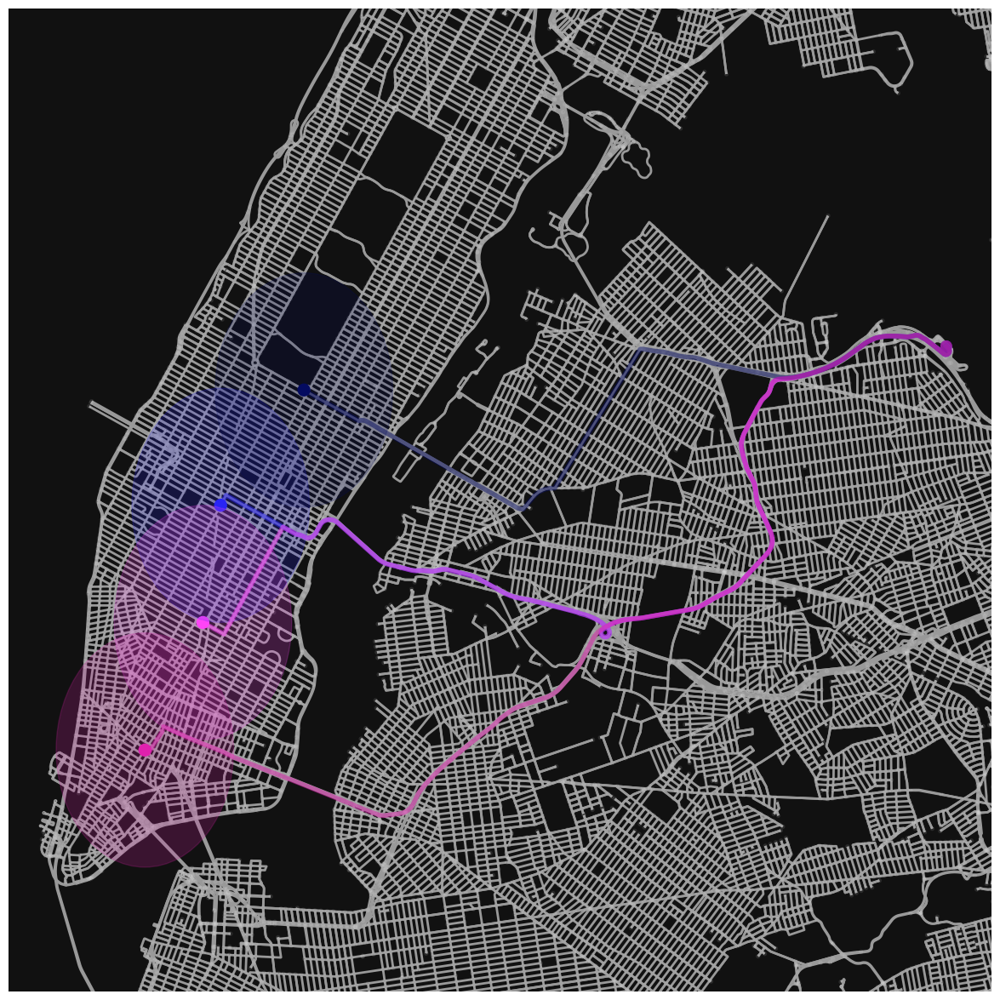

In [35]:
from pulp import *

def plot_routes(coverage_radius, assigned_nodes):
    assigned_nodes = assigned_nodes[:-1]
    routes = [obtain_veh_route(i) for i in assigned_nodes]
    colors =  [np.random.rand(3) for _ in range(len(assigned_nodes))]
    
    _ , ax = ox.plot_graph_routes(
        G, 
        show=False, 
        close=False, 
        routes=routes, 
        route_colors=colors,
        figsize=(15,15), 
        bbox=bbox, 
        node_alpha=0.1,
        edge_alpha=1.0, 
        edge_linewidth=2.0
    )
    
    assigned_nodes_df = nodes.loc[assigned_nodes]
    assigned_nodes_df['c_id'] = colors
    assigned_nodes_df['route'] = routes
    assigned_nodes_df.plot(
        ax=ax, 
        c=assigned_nodes_df["c_id"], 
        markersize=100
    )

    coverage_radius /= 100000
    for _, r in assigned_nodes_df.iterrows():
        ax.add_patch(
            plt.Circle((r['x'], r['y']), 
            radius = coverage_radius, 
            color=r['c_id'], 
            alpha=0.2
        )
    )     
    plt.show()

def obtain_veh_route(origin_node, weight_type='travel_time', terminal_node=5969794486):
    return ox.shortest_path(
        G, 
        origin_node, 
        terminal_node, 
        weight=weight_type
    )

def parallel_route_optimization(
    alpha: float,
    num_stops: int, 
    coverage_radius: int, 
    geo_coverage_prop: float,
    node_demands: pd.DataFrame, 
    link_distances: pd.DataFrame, 
    link_travel_times: pd.DataFrame,
    plot = True
):
    model = LpProblem("Parallel Routing Model", LpMaximize)

    terminal_node_id = 5969794486
    ttl_stops = num_stops + 1
    ttl_nodes = len(node_demands)
    node_demands = node_demands['d']

    #define X_i, which determines whether a node is covered...
    vars_covered_id = [f'X_{i}' for i in node_demands.index]
    vars_covered = LpVariable.dicts(
        name='assignments',
        indices=vars_covered_id,
        cat=LpInteger, 
        lowBound=0, 
        upBound=1, 
    ) 
    vars_covered_arr = np.array(list(vars_covered.values()))

    #define Y_i, determining facility assignment
    vars_fac_id = [f'Y_{i}' for i in node_demands.index]
    vars_fac = LpVariable.dicts(
        name='placements',
        indices=vars_fac_id,
        cat=LpInteger, 
        lowBound=0, 
        upBound=1, 
    ) 
    vars_fac_arr = np.array(list(vars_fac.values()))
    coverage_maximization = lpSum(alpha*(node_demands*vars_covered_arr))
    dest_costs = link_travel_times[terminal_node_id].to_numpy()
    cost_minimization = lpSum((1-alpha)*(dest_costs*vars_fac_arr))
    
    model += (coverage_maximization - cost_minimization)

    #enforce number of stations
    model += (lpSum(vars_fac.values()) == ttl_stops)

    #balance w fair geographical coverage...
    model += ((lpSum(vars_covered.values())/ttl_nodes) >= geo_coverage_prop)

    #ensure a node is covered by at least one stop...
    for id, x_i in vars_covered.items():
        node_id = id.replace('X_', '')
        N_i = search_nearby_nodes(node_id, link_distances, coverage_radius) 
        coverage_i = 0
        for y_j in N_i: 
            node_id_j = f'Y_{y_j}'
            coverage_i += vars_fac[node_id_j]

        model += (x_i <= coverage_i)

    model.solve()
    assigned_stops = [
        int(i.replace('Y_', '')) for i,k in vars_fac.items() if k.value() == 1
    ]

    maximized_demand_coverage =  (np.array([i.value() for i in vars_covered.values()])*node_demands).sum() 
    objective_val = value(model.objective)
    for idx,v in enumerate(vars_fac.items()): 
        i,j = v
        vars_fac[i] = j.value() * dest_costs[idx]

    if plot: 
        plot_routes(coverage_radius, assigned_stops)
    
    return {
        'Stops': assigned_stops, 
        'Objective': objective_val, 
        'Costs': vars_fac, 
        'Total Covered Demand': maximized_demand_coverage
    }

result = parallel_route_optimization(
    alpha = 0.75,
    num_stops=4,
    coverage_radius=1500,
    geo_coverage_prop=0.50,
    node_demands=demand_vector, 
    link_distances=distances_update, 
    link_travel_times=times_update,
    plot=True
)

In [37]:
costs = np.array(list(result['Costs'].values()))
route_times = costs[costs > 0]
demand = result['Total Covered Demand'] / demand_vector['d'].sum()
#this seems to neglect congestion effects...
print(f'Demand Covered: {demand}')
print(f'Total System Time: {route_times.sum() / 60} min')
print(f'Average User System Time: {route_times.mean() / 60} min')


Demand Covered: 0.9794614161596664
Total System Time: 60.442870895782484 min
Average User System Time: 15.110717723945621 min


In [2]:
route_times

NameError: name 'route_times' is not defined

In [23]:
result

{'Stops': [42439972, 42431614, 42437890, 1773076511, 5969794486],
 'Objective': -1131.745467760998,
 'Costs': {'Y_42439972': 897.1467842437812,
  'Y_9140654137': 0.0,
  'Y_42430304': 0.0,
  'Y_42430329': 0.0,
  'Y_42430352': 0.0,
  'Y_42449961': 0.0,
  'Y_42435644': 0.0,
  'Y_42453952': 0.0,
  'Y_42447020': 0.0,
  'Y_42428493': 0.0,
  'Y_42431549': 0.0,
  'Y_42430233': 0.0,
  'Y_42435598': 0.0,
  'Y_42430271': 0.0,
  'Y_42436700': 0.0,
  'Y_42430633': 0.0,
  'Y_42435684': 0.0,
  'Y_1825841742': 0.0,
  'Y_4347534767': 0.0,
  'Y_42430253': 0.0,
  'Y_42457319': 0.0,
  'Y_42440012': 0.0,
  'Y_42440287': 0.0,
  'Y_42430378': 0.0,
  'Y_5706569898': 0.0,
  'Y_42427427': 0.0,
  'Y_42430126': 0.0,
  'Y_42446266': 0.0,
  'Y_4597668020': 0.0,
  'Y_42448693': 0.0,
  'Y_42451665': 0.0,
  'Y_42439996': 0.0,
  'Y_42429782': 0.0,
  'Y_42452067': 0.0,
  'Y_42428201': 0.0,
  'Y_42430160': 0.0,
  'Y_9121386334': 0.0,
  'Y_4461990857': 0.0,
  'Y_42435923': 0.0,
  'Y_42428223': 0.0,
  'Y_588546891': 0.0,
 

In [24]:
times_update / 60

,42439972,9140654137,42430304,42430329,42430352,42449961,42435644,42453952,42447020,42428493,...,4149936235,42453038,42429661,2821304137,42452015,42431461,4149936245,42432679,1773076511,5969794486
42439972,0.000000,1.743646,1.237673,0.651704,1.468776,3.280586,1.233989,8.326291,4.425307,4.240147,...,9.078898,6.581254,2.710844,7.896997,5.900466,4.779069,9.005301,9.999115,6.962731,14.952446
9140654137,1.960295,0.000000,1.875483,1.537510,1.752190,1.712492,2.695419,7.961710,2.902125,3.334911,...,9.171184,7.460287,4.169049,7.528615,6.779498,3.870808,9.097588,9.614057,6.057495,13.734751
42430304,1.245377,1.860207,0.000000,0.822591,1.639663,3.451473,0.820307,7.770224,4.596194,3.143424,...,8.665215,6.167572,2.297162,7.337128,5.486784,3.682347,8.591619,9.443047,5.866009,14.298763
42430329,0.422786,1.547861,1.660458,0.000000,0.817072,2.628882,1.656775,8.749077,3.773603,4.222316,...,9.501683,7.004040,3.133630,8.319783,6.323251,4.761239,9.428087,10.421900,6.944901,14.529659
42430352,1.472973,1.728085,2.587203,2.062608,0.000000,1.811810,2.706962,9.437406,2.956531,4.810607,...,10.551870,8.054227,4.183817,9.004311,7.373438,5.349529,10.478274,11.110230,7.533191,15.325817
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42431461,5.062070,3.850015,3.816693,4.639284,5.438468,4.586810,4.634607,5.289299,5.782613,0.816629,...,6.498773,4.787875,2.568588,4.856204,4.107087,0.000000,6.425176,6.403551,2.687430,15.332021
4149936245,9.220484,9.338231,7.975108,8.797699,9.614771,10.622266,8.265917,1.147807,11.660131,6.114819,...,0.073596,2.655830,6.720357,1.813500,3.396944,6.695207,0.000000,1.648459,4.249199,19.050378
42432679,9.518424,9.320785,8.273048,9.095639,9.912711,9.961651,8.563857,1.445747,10.801719,6.097374,...,1.357445,2.953770,7.018297,2.111440,3.694884,6.444995,1.403752,0.000000,3.528164,18.433569
1773076511,6.998597,5.792621,5.753220,6.575811,7.374995,6.843889,6.442887,2.984735,8.039692,2.569209,...,4.194209,2.521037,4.500151,2.569528,1.840248,2.916831,4.120613,3.748983,0.000000,14.929765


/opt/anaconda3/envs/cusp_python_3_9/lib/python3.9/site-packages/pulp/pulp.py:1298: UserWarning: Spaces are not permitted in the name. Converted to '_'
  warnings.warn("Spaces are not permitted in the name. Converted to '_'")


42439972       894.406353
9140654137     821.344634
42430304       855.048799
42430329       869.039163
42430352       916.808963
                 ...     
42431461       917.044247
4149936245    1141.339429
42432679      1104.330898
1773076511     894.102640
5969794486       0.000000
Name: 5969794486, Length: 66, dtype: float64
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /opt/anaconda3/envs/cusp_python_3_9/lib/python3.9/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/925986e9f325466c9ab56bacd1d0aedc-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/925986e9f325466c9ab56bacd1d0aedc-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 73 COLUMNS
At line 1526 RHS
At line 1595 BOUNDS
At line 1728 ENDATA
Problem MODEL has 68 rows, 132 columns and 1057 elements
Coin0008I MODEL read with 0 errors
Option 

/opt/anaconda3/envs/cusp_python_3_9/lib/python3.9/site-packages/osmnx/plot.py:348: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(od_x, od_y, s=orig_dest_size, c=route_color, alpha=route_alpha, edgecolor="none")


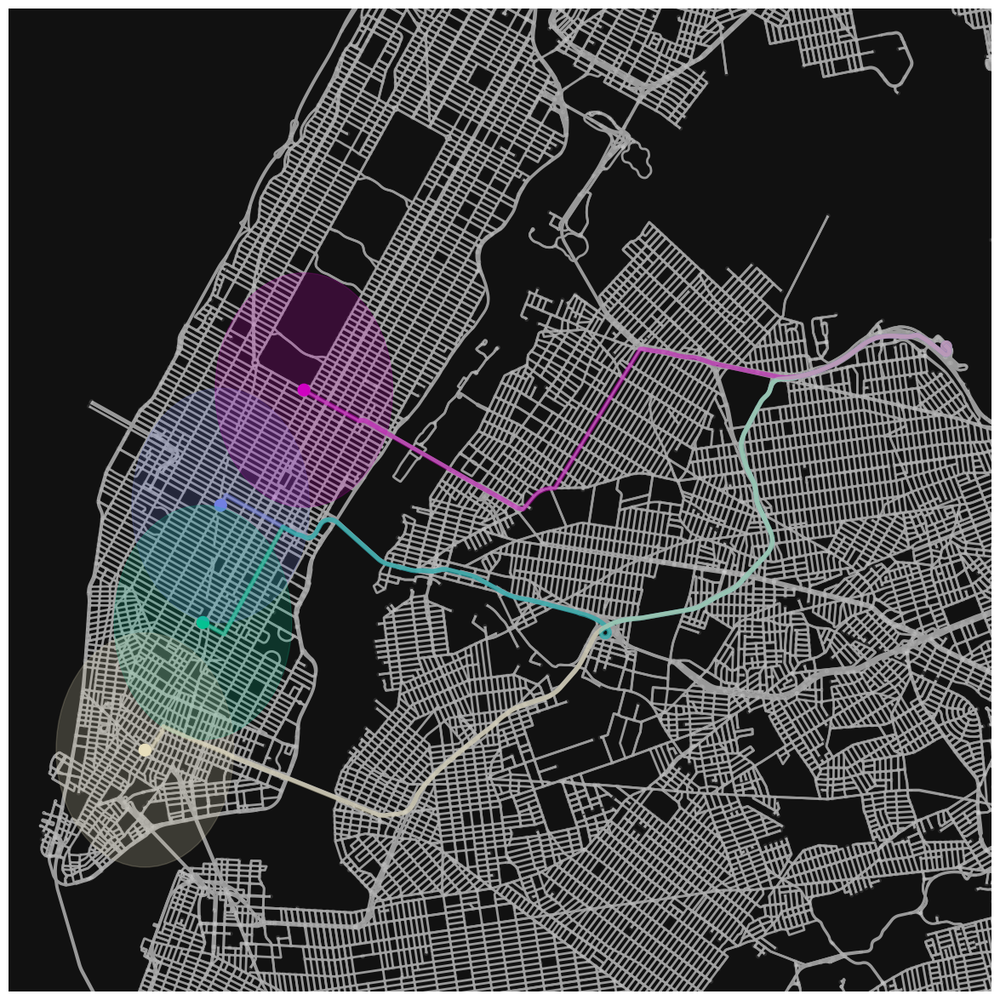

In [1]:
from build_parallel_route import *
model = ParallelRouteOptimation(
    alpha=0.75,
    num_stops=4, 
    coverage_radius=1500,
    geo_coverage_prop=0.5
)

model.solve_problem()
model.build_route_parameters()
model.plot_route()

In [3]:
model.results

{'Stops': [42430304, 42428493, 4347534767, 5706569898, 5969794486],
 'Objective': 525.7991187169667,
 'Costs': {'Y_42439972': np.float64(0.0),
  'Y_9140654137': np.float64(0.0),
  'Y_42430304': np.float64(855.0487990750803),
  'Y_42430329': np.float64(0.0),
  'Y_42430352': np.float64(0.0),
  'Y_42449961': np.float64(0.0),
  'Y_42435644': np.float64(0.0),
  'Y_42453952': np.float64(0.0),
  'Y_42447020': np.float64(0.0),
  'Y_42428493': np.float64(942.0026597827764),
  'Y_42431549': np.float64(0.0),
  'Y_42430233': np.float64(0.0),
  'Y_42435598': np.float64(0.0),
  'Y_42430271': np.float64(0.0),
  'Y_42436700': np.float64(0.0),
  'Y_42430633': np.float64(0.0),
  'Y_42435684': np.float64(0.0),
  'Y_1825841742': np.float64(0.0),
  'Y_4347534767': np.float64(858.2678345168864),
  'Y_42430253': np.float64(0.0),
  'Y_42457319': np.float64(0.0),
  'Y_42440012': np.float64(0.0),
  'Y_42440287': np.float64(0.0),
  'Y_42430378': np.float64(0.0),
  'Y_5706569898': np.float64(963.1087742101136),
 

##### Scenario B: Integrated / Sequential Route Design

/opt/anaconda3/lib/python3.12/site-packages/pulp/pulp.py:1298: UserWarning: Spaces are not permitted in the name. Converted to '_'
  warnings.warn("Spaces are not permitted in the name. Converted to '_'")


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /opt/anaconda3/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/35d32747b19d4fc981370dabb3a05d14-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/35d32747b19d4fc981370dabb3a05d14-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 4495 COLUMNS
At line 98541 RHS
At line 103032 BOUNDS
At line 107455 ENDATA
Problem MODEL has 4490 rows, 4488 columns and 80845 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 1043.3 - 0.02 seconds
Cgl0002I 65 variables fixed
Cgl0008I 66 inequality constraints converted to equality constraints
Cgl0004I processed model has 4360 rows, 4487 columns (4422 integer (4422 of which binary)) and 80585 elements
Cbc0038I Initial state - 14 integers uns

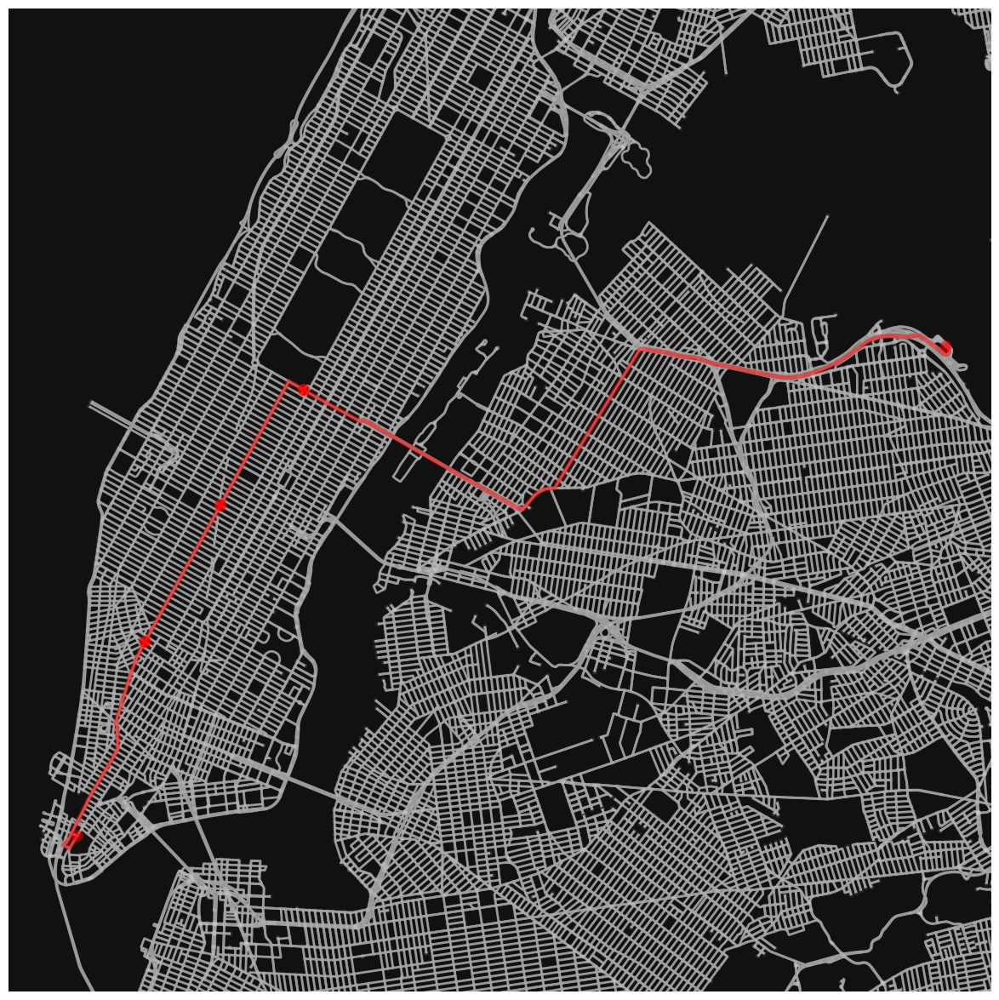

{'Objective Value': 958.0687532322785,
 'Coverage Optimized Route': ['42430304_4347534767',
  '42430233_42430304',
  '4347534767_5969794486',
  '42428368_42430233'],
 'Maximized Demand Coverage': 1799.8769327221812,
 'Minimized Costs/Times': {'42430304_4347534767': 197.89668768801056,
  '42430233_42430304': 198.8218450529393,
  '4347534767_5969794486': 858.9748570794759,
  '42428368_42430233': 311.6623954170032}}

In [51]:
from itertools import combinations

def subsets_of_size_k(lst, k):
    return list(combinations(lst, k))

def find_distance(matrix, nodeA, nodeB):
    return matrix.loc[int(nodeA), int(nodeB)]

def plot_route(ttl_route): 
    routes = [
        obtain_veh_route(
            int(i.split('_')[0]), 
            terminal_node=int(i.split('_')[1])
        ) for i in ttl_route
    ]

    ox.plot_graph_routes(
        G, 
        show=False, 
        close=False, 
        routes=routes, 
        figsize=(15,15), 
        bbox=bbox, 
        node_alpha=0.1,
        edge_alpha=1.0, 
        edge_linewidth=2.0
    )
    plt.show()
    pass 

def sequential_route_optimization(
    alpha: float,
    num_stops: int, 
    coverage_radius: int, 
    geo_coverage_prop: float,
    node_demands: pd.DataFrame, 
    link_distances: pd.DataFrame, 
    link_travel_times: pd.DataFrame,
    origin_node_id: int, 
    terminal_node_id: int,
    plot = True
):
    
    model = LpProblem("Sequential Routing Model", LpMaximize)

    ttl_stops = num_stops #+ 1
    ttl_nodes = len(node_demands)
    node_list = node_demands.index
    node_demands = node_demands['d']

    #define X_i, which determines whether a node is covered...
    vars_covered_id = [f'{i}' for i in node_list]
    vars_covered = LpVariable.dicts(
        name='X',
        indices=vars_covered_id,
        cat=LpInteger, 
        lowBound=0, 
        upBound=1, 
    ) 
    vars_covered_arr = np.array(list(vars_covered.values()))

    #define Y_ij, determining route nodes to maximize coverage
    vars_fac_id = [f'{i}_{j}' for i in node_list for j in node_list]
    vars_fac = LpVariable.dicts(
        name='Y',
        indices=vars_fac_id,
        cat=LpInteger, ###change if needed
        lowBound=0, 
        upBound=1
    ) 
    vars_fac_arr = np.array(list(vars_fac.values()))

    #subtour elim proxy vars
    tour_order_vars = LpVariable.dicts(
        name='T', indices=list(node_list), cat=LpContinuous, lowBound=0
    )


    coverage_maximization = lpSum(alpha*(node_demands*vars_covered_arr))

    link_costs = np.array(list(map(lambda i: find_distance(link_travel_times, *i.split('_')), vars_fac.keys())))
    cost_minimization = lpSum((1-alpha)*(link_costs*vars_fac_arr))
    
    model += (coverage_maximization - cost_minimization)

    #enforce number of stations
    model += (lpSum(vars_fac.values()) == ttl_stops)

    #balance w fair geographical coverage...
    model += ((lpSum(vars_covered.values())/ttl_nodes) >= geo_coverage_prop)

    #subtour/cycle elim. --- only consider "small paths" for runtime 
    M = 10000
    for i in node_list: 
        if i == origin_node_id:
            continue
        for j in node_list:
            if i != j: 
                model += ((tour_order_vars[i] - tour_order_vars[j] + M*vars_fac[f'{i}_{j}']) <= M - 1)
            else: 
                model += (vars_fac[f'{i}_{j}'] == 0)
    
   # sizes = np.arange(1,4)
   # for size in sizes: 
    #    subsets = subsets_of_size_k(node_list, size)
     #   for s in subsets: 
      #      enumerate_combos = [f'{i}_{j}' for i in s for j in s]
       #     summed = sum([vars_fac[k] for k in enumerate_combos])
        #    model += (summed <= size - 1)
            
    #path-based flow conservation
    for i in node_list:
        s1 = sum([y_ij for idx, y_ij in vars_fac.items() if idx.split('_')[0] == str(i) and idx.split('_')[1] != str(i)])
        s2 = sum([y_ji for idx, y_ji in vars_fac.items() if idx.split('_')[1] == str(i) and idx.split('_')[0] != str(i)])
        
        if i == origin_node_id: 
            model += (s1 == (1 + s2))
        elif i == terminal_node_id: 
            model += (s1 == (-1 + s2))
        else:
            model += (s1 == s2)

        #ensure the MST is a linked list (no branches!!!)
        model += (s1 <= 1)

        #model += (s2 <= 1)

    #coverage 
    for id, x_k in vars_covered.items():
        S_k = search_nearby_nodes(id, link_distances, coverage_radius) 
        coverage_k = 0
        for j in S_k: 
            
            #only consider upstream nodes that are within the scope of the route we're constructing (from origin -> dest)
            N_j = [i for i in node_list if i != j and find_distance(link_distances, i, terminal_node_id) <= find_distance(link_distances, origin_node_id, terminal_node_id)] 
            for i in N_j:
                y_ij = vars_fac[f'{i}_{j}']
                coverage_k += y_ij
        model += (x_k <= coverage_k) 

    model.solve() 
    
    objective_val = value(model.objective)
    coverage_optimized_route = [
        link for link, v in vars_fac.items() if v.value() > 0
    ]
    maximized_demand_coverage =  (np.array([i.value() for i in vars_covered.values()])*node_demands).sum()
    vars_fac_ret = vars_fac.copy()
    for idx,v in enumerate(vars_fac.items()): 
        i,j = v
        if j.value() == 0: 
            del vars_fac_ret[i]
        else:
            vars_fac_ret[i] = j.value() * link_costs[idx]

    if plot: 
        plot_route(coverage_optimized_route)
    
    return {
        'Objective Value': objective_val, 
        'Coverage Optimized Route': coverage_optimized_route, 
        'Maximized Demand Coverage': maximized_demand_coverage, 
        'Minimized Costs/Times': vars_fac_ret
    }

output_data = \
sequential_route_optimization(
    alpha = 0.75,
    num_stops = 4, 
    coverage_radius = 1500, 
    geo_coverage_prop = 0.50,
    node_demands = demand_vector, 
    link_distances = distances_update, 
    link_travel_times = times_update,
    origin_node_id = 42428368, 
    terminal_node_id = 5969794486,
    plot = True
)


output_data

In [49]:
demand = output_data['Maximized Demand Coverage'] / demand_vector['d'].sum()
print(f'Demand Covered: {demand}')

costs = output_data['Minimized Costs/Times'].values()
print(f'Total System Time: {sum(costs) / 60}')

avg_user_cost = np.array(sorted(costs, reverse=True)).cumsum().mean() 
print(f'Average User System Time: {avg_user_cost / 60}')

Demand Covered: 0.8519333246917801
Total System Time: 22.806833222198495
Average User System Time: 19.01100639887757


/opt/anaconda3/envs/cusp_python_3_9/lib/python3.9/site-packages/pulp/pulp.py:1298: UserWarning: Spaces are not permitted in the name. Converted to '_'
  warnings.warn("Spaces are not permitted in the name. Converted to '_'")
/opt/anaconda3/envs/cusp_python_3_9/lib/python3.9/site-packages/pulp/pulp.py:1298: UserWarning: Spaces are not permitted in the name. Converted to '_'
  warnings.warn("Spaces are not permitted in the name. Converted to '_'")


Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /opt/anaconda3/envs/cusp_python_3_9/lib/python3.9/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/61d486df99864247968f9a5d9b69d6fd-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/wx/wz1pbs1903j_cfgqws400dz80000gn/T/61d486df99864247968f9a5d9b69d6fd-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 4495 COLUMNS
At line 99334 RHS
At line 103825 BOUNDS
At line 108248 ENDATA
Problem MODEL has 4490 rows, 4488 columns and 81638 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Continuous objective value is 1043.72 - 0.02 seconds
Cgl0002I 65 variables fixed
Cgl0008I 66 inequality constraints converted to equality constraints
Cgl0004I processed model has 4360 rows, 4488 columns (4423 integer (4423 of which binary)) and 80599 elements
Cbc0038I Initial st

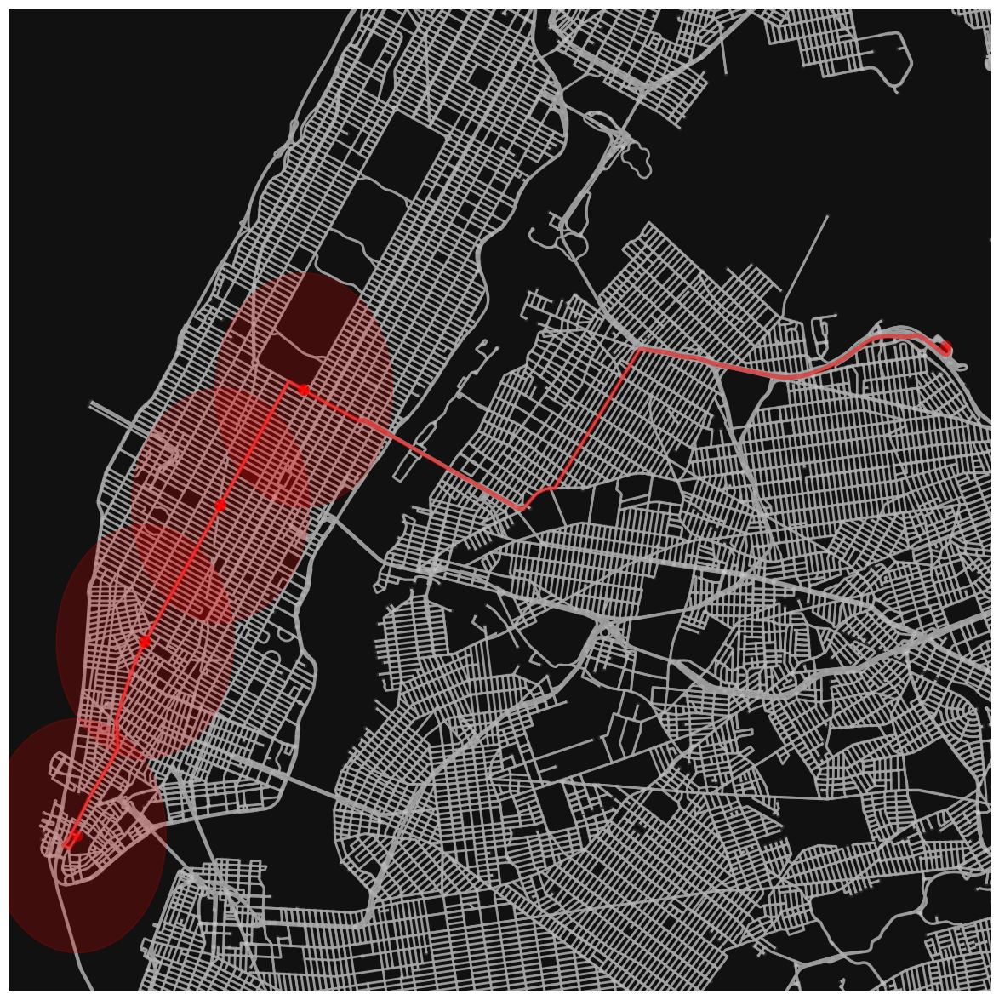

In [1]:
from build_sequential_route import SequentialRouteOptimization
model = SequentialRouteOptimization(
    alpha=0.75,
    num_stops=4, 
    coverage_radius=1500,
    geo_coverage_prop=0.5, 
    origin_node_id = 42428368
)

model.solve_problem()
model.build_route_parameters()
model.plot_route()

In [5]:
d=model.results['Minimized Costs/Times']
d['index'].to_list()

['4347534767', '42430304', '42430233', '42428368']

In [26]:
import pandas as pd
d=model.results['Minimized Costs/Times']

t=pd.DataFrame(d, index=['cost']).T.reset_index()

t['index'] = t['index'].apply(lambda x: x.split('_')[0])
t=t.sort_values(by=['index'], ascending=False)
stop_costs = t['cost'].cumsum() / 60
stop_costs

2    14.304464
0    17.602742
1    20.916439
3    26.110813
Name: cost, dtype: float64

In [27]:
t

,index,cost
2,4347534767,858.267835
0,42430304,197.896688
1,42430233,198.821845
3,42428368,311.662395


### Headways Optimization and Bus Capacity/Utilization Analysis

In [ ]:
import requests
import pandas as pd 
bus_ridership_endpoint = 'https://data.ny.gov/resource/kv7t-n8in.json'
r=requests.get(
        url = bus_ridership_endpoint, 
        params={
            '$select':'transit_timestamp,SUM(ridership),SUM(transfers)',
            '$group':'transit_timestamp',
            '$where':"bus_route='Q70+'",
            '$limit':50000
        }
    )

bus_ridership = pd.DataFrame(r.json())
bus_ridership.head()


<Axes: xlabel='hour'>

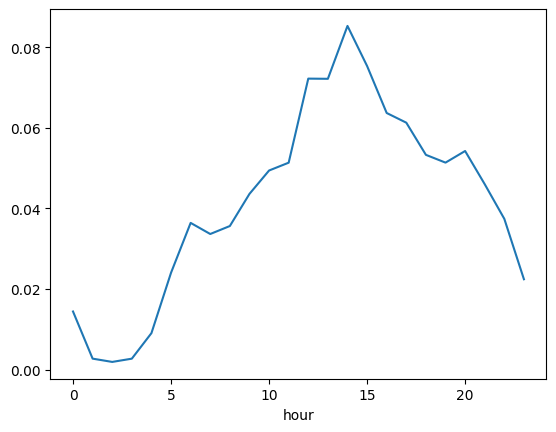

In [30]:
import numpy as np 

bus_ridership['hour'] = pd.to_datetime(bus_ridership['transit_timestamp']).dt.hour
bus_ridership['day'] = pd.to_datetime(bus_ridership['transit_timestamp']).dt.day
bus_ridership['dow'] = pd.to_datetime(bus_ridership['transit_timestamp']).dt.day_of_week
bus_ridership['month'] = pd.to_datetime(bus_ridership['transit_timestamp']).dt.month 
bus_ridership['year'] = pd.to_datetime(bus_ridership['transit_timestamp']).dt.year 

bus_data = bus_ridership.drop(
    columns=['transit_timestamp']
)\
.rename(
    columns = {
        'SUM_ridership':'ridership',
        'SUM_transfers':'transfers'
    }
)
bus_data['ridership'] = bus_data['ridership'].astype(np.float64)
bus_data['transfers'] = bus_data['transfers'].astype(np.float64)

by_hr = bus_data.groupby(['hour'])['ridership'].median() 
by_hr = by_hr / by_hr.sum() 

#by_hr.plot()

In [68]:
stop_ids = [float(i.split('_')[0]) for i in output_data['Coverage Optimized Route']]
demand_vector_route_only = demand_vector.reset_index()#.iloc[list(stop_ids)]
demand_vector_route_only = demand_vector_route_only.rename(
    columns={
        'index':'stop_id'
    }
)

demand_vector_route_only = demand_vector_route_only.loc[demand_vector_route_only['stop_id'].isin(stop_ids)]
demand_vector_route_only['covered_stops'] = demand_vector_route_only['stop_id'].apply(lambda id: list(search_nearby_nodes(id, distances_update, 1500)))
demand_vector_route_only['covered_demand'] = demand_vector_route_only['covered_stops'].apply(lambda l: demand_vector.loc[l]['d'].sum())
demand_vector_route_only
#demand_vector_s.loc[demand_vector_s['index'].isin(stop_ids)]
#demand_vector_s



,stop_id,d,covered_stops,covered_demand
2,42430304,59.717779,"[42439972, 9140654137, 42430304, 42430329, 424...",453.964421
7,42453952,35.278861,"[42453952, 42440287, 5706569898, 42430126, 912...",107.497106
11,42430233,23.447858,"[42428493, 42430233, 42435598, 42430271, 42430...",159.861126
18,4347534767,16.584103,"[42430352, 42449961, 42447020, 42431549, 42436...",234.207422
46,42428368,4.786590,"[42453952, 42440287, 588546891, 279151954, 424...",75.271610


In [80]:
#let's assume a standard articulated bus, let N = 50 
#the MTA states that they can safely hold 80 passengers 
#but contrain to sitting capacity only, and note that these demand estimates are potentially on the lower side compared to reality...
demand_per_hr = sum([d*by_hr for d in demand_vector_route_only['covered_demand']])
headways = 60 / np.ceil(demand_per_hr / 50) 
headways


hour
0     60.0
1     60.0
2     60.0
3     60.0
4     60.0
5     60.0
6     60.0
7     60.0
8     60.0
9     60.0
10    30.0
11    30.0
12    30.0
13    30.0
14    30.0
15    30.0
16    30.0
17    30.0
18    30.0
19    30.0
20    30.0
21    60.0
22    60.0
23    60.0
Name: ridership, dtype: float64

In [1]:
demand_per_hr

NameError: name 'demand_per_hr' is not defined